In [7]:
import holoviews as hv
import hvplot.xarray
import xarray as xr 
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

## H-Mode and ELM Tagging

### H-Mode
H-mode (High-Confinement Mode) is an operational regime in tokamak and other magnetic confinement fusion devices characterized by enhanced plasma confinement.  H-mode achieves higher plasma temperatures and densities compared to L-mode (Low-Confinement Mode), making it a desirable operating state for fusion research due to its potential for sustained fusion conditions.

### ELMS
Edge Localized Modes (ELMs) are instabilities that occur at the edge of the plasma in tokamak reactors, specifically within the H-mode (high-confinement mode) operational regime. ELMs result in the periodic ejection of plasma particles and energy from the edge into the surrounding areas, often leading to energy losses and potentially damaging the reactor's components. Understanding and managing ELMs is crucial in fusion research to ensure the stability and durability of fusion reactors.


### Types of ELMs
ELMs can be classified into several types, primarily based on the frequency and size of energy ejections:

 - Type I (Large) ELMs: These ELMs are associated with large, sporadic energy losses and occur at higher plasma pressures. They generally increase in frequency as the power to the plasma rises.

 - Type II (Small) ELMs: These occur at a lower magnitude than Type I ELMs, with less energy loss and are observed at lower edge current density.

 - Type III (Grassy) ELMs: Smaller and more frequent, these ELMs are often observed in plasmas with lower confinement and power input.



References:
 - https://dx.doi.org/10.1088/1741-4326/abe370
 - https://doi.org/10.1088/0741-3335/38/2/001
 - https://doi.org/10.1016/j.net.2022.08.026


### Example Data

Looking at shot 30462 which the operator noted: _"H mode present, good beam. Type III ELMs followed by type I"_

In [5]:
shot_id = 30462
path = f'../data/{shot_id}.zarr'
thomson = xr.open_zarr(path, group='thomson_scattering')
core = xr.open_zarr(path, group='core_profiles')
dalpha = xr.open_zarr(path, group='dalpha')
magentics = xr.open_zarr(path, group='mirnov')
mirnov_fft = xr.open_zarr(path, group='mirnov_fft')
equilibirum = xr.open_zarr(path, group='equilibrium')
mirnov_fft

<xarray.Dataset> Size: 4MB
Dimensions:              (frequency: 128, time: 656)
Coordinates:
  * frequency            (frequency) float64 1kB 0.0 1.953 3.906 ... 246.1 248.0
  * time                 (time) float64 5kB 0.0 0.000512 ... 0.3348 0.3354
Data variables:
    omv_110_angles       (frequency, time) float64 672kB ...
    omv_110_spectrogram  (frequency, time) float64 672kB ...
    omv_210_angles       (frequency, time) float64 672kB ...
    omv_210_spectrogram  (frequency, time) float64 672kB ...
    omv_310_angles       (frequency, time) float64 672kB ...
    omv_310_spectrogram  (frequency, time) float64 672kB ...

Tokamak signals relevant for ELM identification:

 - __Plasma Current__: Plasma current is the electric current that flows within the plasma in a tokamak or other magnetic confinement fusion device. This current plays a crucial role in maintaining plasma stability, confining the plasma, and sustaining the conditions necessary for fusion reactions.

 - __Normalised Beta__: normalized beta ($\beta_N$) is a measure of the stability of the plasma in a fusion reactor. It is a dimensionless parameter that indicates how close the plasma is to certain stability limits, helping scientists and engineers assess the operating conditions of the plasma in a tokamak.

 - __Neutral Beam Injection__: (NBI) total power refers to the total power delivered to the plasma by neutral beam injectors. NBI is one of the primary methods for heating plasma, driving current, and fueling the plasma in magnetic confinement fusion devices.

 - __Mironv Coils__: Mirnov coils are small, inductive coils typically placed around the perimeter of the tokamak, close to the plasma boundary. They measure changes in the magnetic field caused by the motion and behavior of the plasma. The coils operate on the principle of Faraday’s Law of Induction, where a changing magnetic field induces a voltage in a conductor (in this case, the coil). By analyzing these voltage signals, we can infer information about magnetic field changes due to plasma instabilities.

 - __D-alpha__: (Deuterium-alpha or $D_{\alpha}$ ) refers to the specific wavelength of light emitted by deuterium atoms as they transition between energy levels. D-alpha emission is widely used as a diagnostic tool in tokamaks and other magnetic confinement fusion devices to monitor the plasma behavior, particularly at the edge where plasma interacts with surrounding materials.


In [8]:
tmin, tmax = core.plasma_current.time.values.min(), core.plasma_current.time.values.max()
plot_params = dict(grid=True, xlim=(tmin, tmax), height=150, width=1000)

p1 = core.plasma_current.hvplot(x='time', **plot_params)
p2 = equilibirum.normalized_beta.hvplot(x='time', **plot_params)
p3 = core.tot_sum_power.hvplot(x='time', **plot_params)
p4 = magentics.omv_210.hvplot(x='time', **plot_params)
p5_1 = dalpha.dalpha_mid_plane_wide.hvplot(x='time', **plot_params)
p5_2 = dalpha.dalpha_tangential.hvplot(x='time', **plot_params)
p5 = p5_1 * p5_2
p6 = mirnov_fft.omv_210_spectrogram.hvplot(x='time', y='frequency', **plot_params, logz=True, clim=(1e-5, mirnov_fft.omv_210_spectrogram.values.max()))

plots = p1+p2+p3+p4+p5+p6

layout = hv.Layout(plots).cols(1)
layout
from bokeh.plotting import show

show(hv.render(layout))

/Users/rt2549/projects/annotation/.venv/lib/python3.12/site-packages/holoviews/core/data/pandas.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type
/Users/rt2549/projects/annotation/.venv/lib/python3.12/site-packages/holoviews/core/data/pandas.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type
/Users/rt2549/projects/annotation/.venv/lib/python3.12/site-packages/holoviews/core/data/pandas.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

A closer view of possible ELMs in the H-mode region

In [9]:
tmin, tmax = 0.13, 0.2
plot_params = dict(grid=True, xlim=(tmin, tmax), height=150, width=1000)

p1 = magentics.omv_210.hvplot(x='time', **plot_params, ylim=(-1, 1))
p2_1 = dalpha.dalpha_mid_plane_wide.hvplot(x='time', **plot_params)
p2_2 = dalpha.dalpha_tangential.hvplot(x='time', **plot_params)

plots = p1 + (p2_1*p2_2)
layout = hv.Layout(plots).cols(1)
layout

/Users/rt2549/projects/annotation/.venv/lib/python3.12/site-packages/holoviews/core/data/pandas.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type
/Users/rt2549/projects/annotation/.venv/lib/python3.12/site-packages/holoviews/core/data/pandas.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type
/Users/rt2549/projects/annotation/.venv/lib/python3.12/site-packages/holoviews/core/data/pandas.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

:Layout
   .Curve.I   :Curve   [time]   (omv_210)
   .Overlay.I :Overlay
      .Curve.I  :Curve   [time]   (dalpha_mid_plane_wide)
      .Curve.II :Curve   [time]   (dalpha_tangential)

In [10]:
tmin, tmax = 0.14, 0.155

plot_params = dict(grid=True, xlim=(tmin, tmax), height=150, width=1000)

p1 = magentics.omv_210.hvplot(x='time', **plot_params, ylim=(-1, 1))
p2_1 = dalpha.dalpha_mid_plane_wide.hvplot(x='time', **plot_params)
p2_2 = dalpha.dalpha_tangential.hvplot(x='time', **plot_params)

plots = p1 + (p2_1*p2_2)
layout = hv.Layout(plots).cols(1)
layout

/Users/rt2549/projects/annotation/.venv/lib/python3.12/site-packages/holoviews/core/data/pandas.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type
/Users/rt2549/projects/annotation/.venv/lib/python3.12/site-packages/holoviews/core/data/pandas.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type
/Users/rt2549/projects/annotation/.venv/lib/python3.12/site-packages/holoviews/core/data/pandas.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

:Layout
   .Curve.I   :Curve   [time]   (omv_210)
   .Overlay.I :Overlay
      .Curve.I  :Curve   [time]   (dalpha_mid_plane_wide)
      .Curve.II :Curve   [time]   (dalpha_tangential)

# Data Validation

The MAST data has poor quality data validation. It is often unclear if there is a problem with a diagnostic without visual inspection. One example is the issue of charge exchage being in consistent with thomson scattering data.

 - __Thomson scattering__: is a diagnostic technique used in fusion research and plasma physics to measure the electron temperature and density in a plasma. It involves scattering of laser light by free electrons within the plasma, allowing for non-invasive, localized measurements of plasma properties.

 - __Charge Exchange Recombination Spectroscopy (CXRS)__: often referred to simply as charge exchange diagnostic, is a technique used in fusion research to measure ion properties within the plasma, such as ion temperature, rotation, and impurity concentration. This diagnostic is based on the process of charge exchange between neutral atoms and ions in the plasma.


The thomson sctattering electron temperature ($T_e$) and the charge exchange ion temperature ($T_i$).

/Users/rt2549/projects/annotation/.venv/lib/python3.12/site-packages/xarray/backends/zarr.py:1337: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  ds = open_dataset(


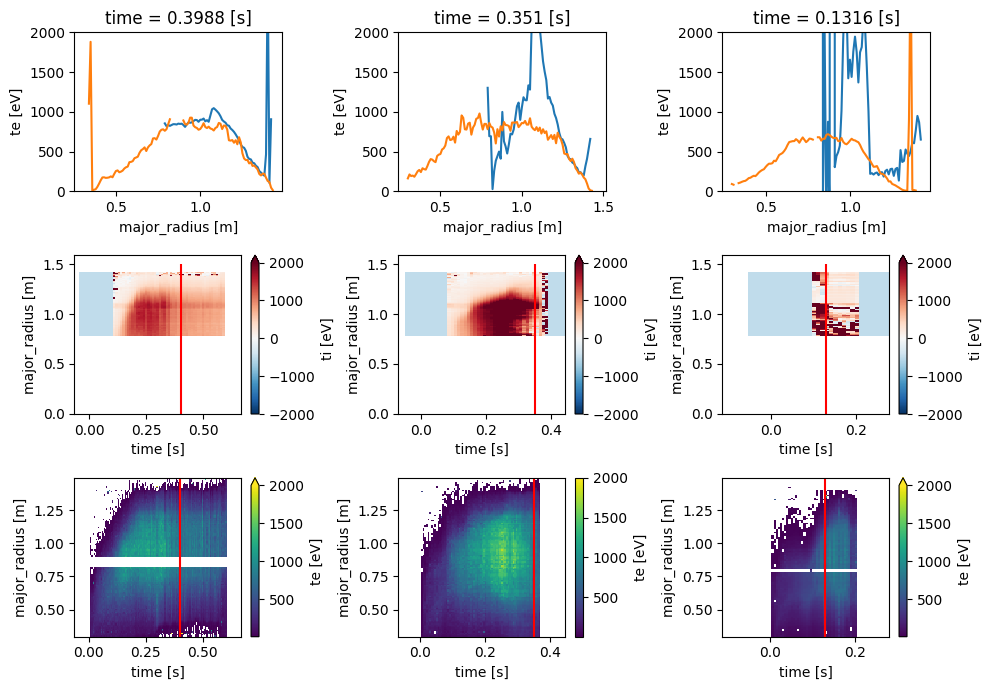

In [14]:
def plot_shot_profiles(path, axes, tcut=0.6):
    vmax = 2000
    charge_exchange = xr.open_zarr(path, group='charge_exchange')
    thomson = xr.open_zarr(path, group='thomson_scattering')
    charge_exchange['ti'].sel(time=tcut, method='nearest').plot(x='major_radius', ax=axes[0])
    thomson['te'].sel(time=tcut, method='nearest').plot(x='major_radius', ax=axes[0])
    axes[0].set_ylim(0, vmax)

    charge_exchange['ti'].plot(x='time', y='major_radius', ax=axes[1], vmax=vmax)
    thomson['te'].plot(x='time', y='major_radius', ax=axes[2], vmax=vmax)
    axes[1].vlines(tcut, 0, 1.5, color='r')
    axes[2].vlines(tcut, 0, 1.5, color='r')

fig, axes = plt.subplots(3, 3, figsize=(10, 7))
data_path = '../data'
plot_shot_profiles(f'{data_path}/30421.zarr', axes[:, 0], tcut=.4)
plot_shot_profiles(f'{data_path}/30430.zarr', axes[:, 1], tcut=.35)
plot_shot_profiles(f'{data_path}/23341.zarr', axes[:, 2], tcut=0.13)
plt.tight_layout()